In [1]:
# ============================================
# scRNA-seq basic Scanpy workflow
# ============================================
#
# This notebook:
# 1. Loads 10x matrix.mtx.gz datasets
# 2. Merges 6 mtxitions
# 3. Performs preprocessing
# 4. Computes PCA + UMAP
# 5. Plots UMAP colored by mtxition
#
# Required directory structure:
#
# ============================================
# 1. Install packages (run once)
# ============================================

%pip install scanpy anndata matplotlib leidenalg

In [2]:
# ============================================
# Download data from GEO
# ============================================ 
!rm -rf data
!mkdir data
!wget "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE196280&format=file" -O GSE196280.tar
!tar -xvf GSE196280.tar --directory data/

--2026-05-20 20:55:50--  https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE196280&format=file
Resolving www.ncbi.nlm.nih.gov (www.ncbi.nlm.nih.gov)... 130.14.29.110, 2607:f220:41e:4290::110
Connecting to www.ncbi.nlm.nih.gov (www.ncbi.nlm.nih.gov)|130.14.29.110|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119162880 (114M) [application/x-tar]
Saving to: ‘GSE196280.tar’

GSE196280.tar        55%[==========>         ]  62.96M  51.6MB/s    in 1.2s    

2026-05-20 20:55:51 (51.6 MB/s) - Connection closed at byte 66014087. Retrying.

--2026-05-20 20:55:52--  (try: 2)  https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE196280&format=file
Connecting to www.ncbi.nlm.nih.gov (www.ncbi.nlm.nih.gov)|130.14.29.110|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119162880 (114M) [application/x-tar]
Saving to: ‘GSE196280.tar’

GSE196280.tar       100%[===================>] 113.64M  67.1MB/s    in 1.7s    

2026-05-20 20:55:54 (67.1 MB/s) - ‘GSE196

In [3]:

# ============================================
# 2. Imports
# ============================================

import scanpy as sc
import re
import anndata as ad
import pandas as pd
import numpy as np
from pathlib import Path


In [4]:
# Plot settings
sc.settings.verbosity = 3
sc.set_figure_params(figsize=(6, 6))

base = Path("data/")
adatas = []
#search all matrix.mtx.gz files in data/ and remove the matrix.mtx.gz suffix to get the mtxition name
for mtx in base.iterdir():
    if not mtx.is_file() or not mtx.name.endswith("matrix.mtx.gz"):
        continue

    mtxition = mtx.name.replace(".matrix.mtx.gz", "")

    #create a subdir called mtxition and move all files with the same mtxition name into it
    dir = base / mtxition
    dir.mkdir(exist_ok=True)
    for file in base.iterdir():
        if file.is_file() and file.name.startswith(mtxition):
            file.rename(dir / file.name.replace(mtxition+".", ""))


for dir in base.iterdir():
    #filter for "naive" in name
    if not dir.is_dir() or "naive" not in dir.name.lower():
        continue

    condition = re.sub(r"GSM[^_]+_", "", dir.name)
    print(f"Loading {condition} from {dir}...")

    adata = sc.read_10x_mtx(
        dir,
        var_names="gene_symbols",
        cache=True
    )

    # Add metadata
    adata.obs["name"] = condition

    # Make unique cell IDs
    adata.obs_names_make_unique()

    # Optional: prefix barcodes with mtxition
    adata.obs_names = [
        f"{condition}_{cell}"
        for cell in adata.obs_names
    ]

    adatas.append(adata)


Loading EZH2i_Naive_D4 from data/GSM5866863_EZH2i_Naive_D4...
... reading from cache file cache/data-GSM5866863_EZH2i_Naive_D4-matrix.h5ad
Loading EZH2i_Naive_D7 from data/GSM5866864_EZH2i_Naive_D7...
... reading from cache file cache/data-GSM5866864_EZH2i_Naive_D7-matrix.h5ad
Loading EZH2i_Naive_WT from data/GSM5866861_EZH2i_Naive_WT...
... reading from cache file cache/data-GSM5866861_EZH2i_Naive_WT-matrix.h5ad
Loading EZH2i_Naive_D2 from data/GSM5866862_EZH2i_Naive_D2...
... reading from cache file cache/data-GSM5866862_EZH2i_Naive_D2-matrix.h5ad


In [5]:
# ============================================
# 5. Merge datasets
# ============================================
print(adatas)

adata = ad.concat(
    adatas,
    axis=0,
    join="outer",
    label="name",
    keys=[adata.obs["name"][0] for adata in adatas],
    index_unique="-"
)

print(adata)

[AnnData object with n_obs × n_vars = 2833 × 33538
    obs: 'name'
    var: 'gene_ids', 'feature_types', AnnData object with n_obs × n_vars = 2640 × 33538
    obs: 'name'
    var: 'gene_ids', 'feature_types', AnnData object with n_obs × n_vars = 2805 × 33538
    obs: 'name'
    var: 'gene_ids', 'feature_types', AnnData object with n_obs × n_vars = 2971 × 33538
    obs: 'name'
    var: 'gene_ids', 'feature_types']


/tmp/ipykernel_23765/3947174397.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  keys=[adata.obs["name"][0] for adata in adatas],


AnnData object with n_obs × n_vars = 11249 × 33538
    obs: 'name'


In [6]:
# ============================================
# 6. Basic QC metrics
# ============================================

# Mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# Calculate QC metrics
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,
    inplace=True
)

# View summary
adata.obs.head()


,name,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
EZH2i_Naive_D4_AAACCCAAGCATCCTA-1-EZH2i_Naive_D4,EZH2i_Naive_D4,3735,14203.0,2092.0,14.729282
EZH2i_Naive_D4_AAACCCACATGGCGCT-1-EZH2i_Naive_D4,EZH2i_Naive_D4,1278,2691.0,712.0,26.458565
EZH2i_Naive_D4_AAACCCACATGTCTAG-1-EZH2i_Naive_D4,EZH2i_Naive_D4,1227,2221.0,295.0,13.282305
EZH2i_Naive_D4_AAACCCACATGTGTCA-1-EZH2i_Naive_D4,EZH2i_Naive_D4,1067,1996.0,199.0,9.969940
EZH2i_Naive_D4_AAACCCAGTCTTGCTC-1-EZH2i_Naive_D4,EZH2i_Naive_D4,679,1280.0,297.0,23.203125


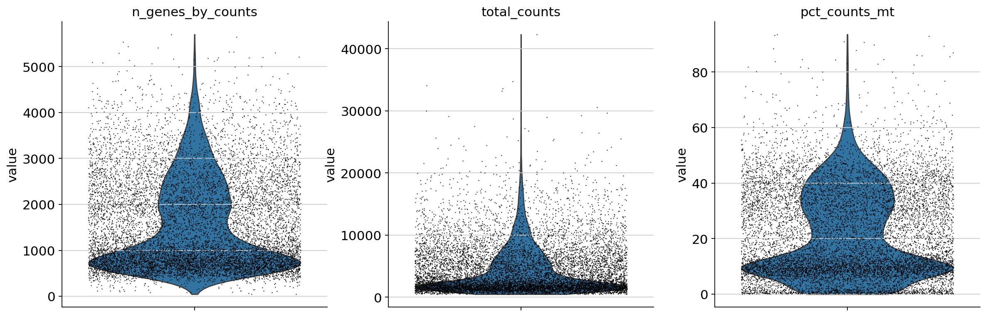

In [7]:
# ============================================
# 7. QC plots
# ============================================

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True
)


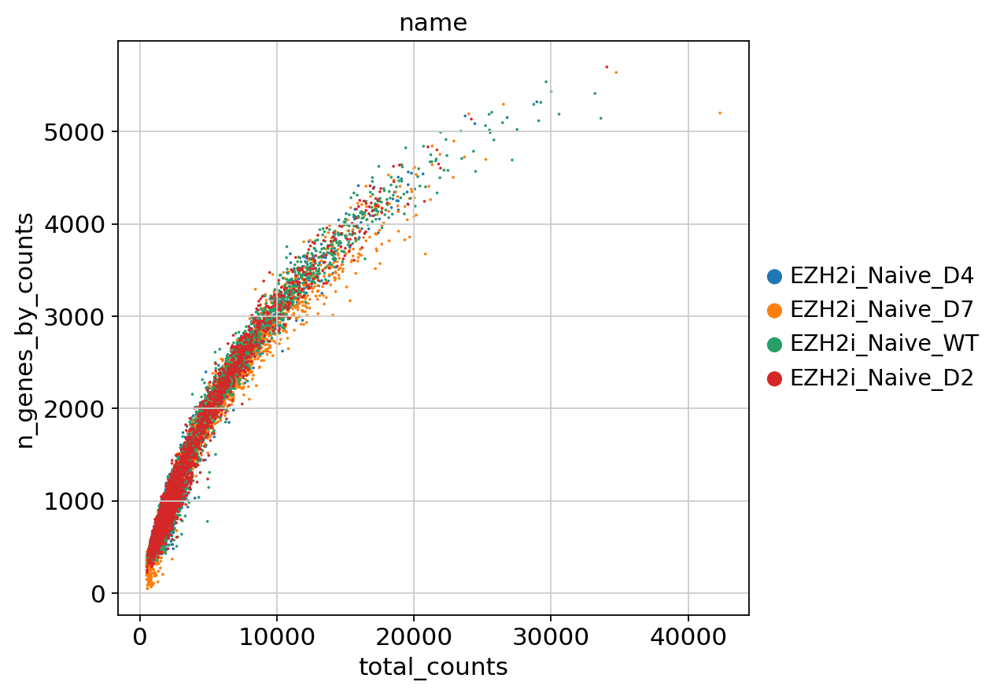

In [8]:

sc.pl.scatter(
    adata,
    x="total_counts",
    y="n_genes_by_counts",
    color="name"
)


In [9]:
# just checking if some interesting genes are present in the dataset
marker_genes = [
    "SOX2",    
    "GATA3",  
    "TMEM88",    
    "CLDN4",
    "CD24",
    "NANOG" 
]

existing_markers = [
    g for g in marker_genes
    if g in adata.var_names
]

print(existing_markers)

['SOX2', 'GATA3', 'TMEM88', 'CLDN4', 'CD24', 'NANOG']


In [10]:

# ============================================
# 8. Filter low-quality cells/genes
# ============================================

# Filter cells
sc.pp.filter_cells(adata, min_genes=200)

# Filter genes
sc.pp.filter_genes(adata, min_cells=3)

# Remove high mitochondrial cells
adata = adata[adata.obs.pct_counts_mt < 15].copy()

print(adata)


filtered out 36 cells that have less than 200 genes expressed
filtered out 13545 genes that are detected in less than 3 cells
AnnData object with n_obs × n_vars = 5278 × 19993
    obs: 'name', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'name_colors'


In [11]:
# ============================================
# 9. Normalize and log transform
# ============================================

# Save raw counts
adata.layers["counts"] = adata.X.copy()

# Normalize counts per cell
sc.pp.normalize_total(
    adata,
    target_sum=1e4
)

# Log transform
sc.pp.log1p(adata)


normalizing counts per cell
    finished (0:00:03)


extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


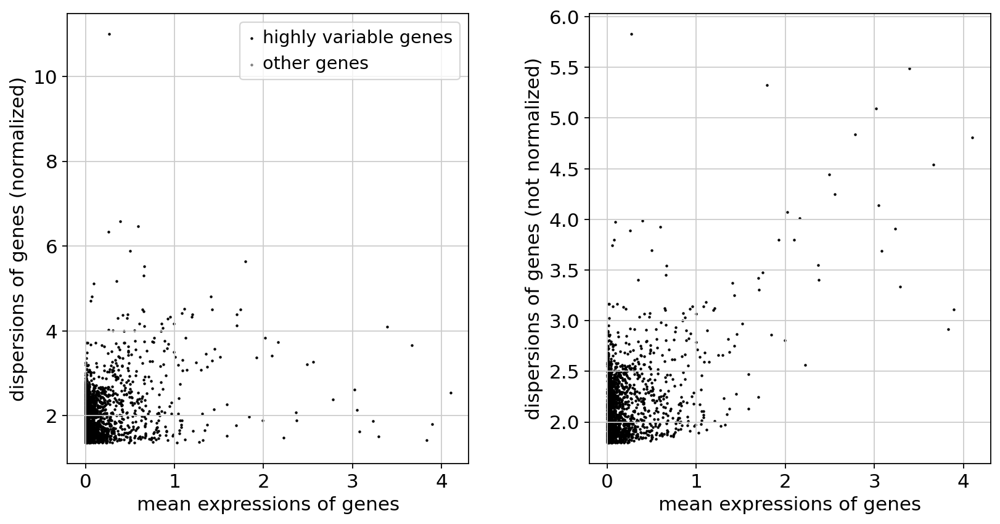

In [ ]:
# ============================================
# 10. Highly variable genes
# ============================================

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    subset=False, #want to keep all the genes for later visualization
    flavor="seurat"
)

adata.raw = adata
adata = adata[:, adata.var.highly_variable].copy()

# Plot HVGs
sc.pl.highly_variable_genes(adata)

In [13]:
# ============================================
# 11. Scale data
# ============================================

sc.pp.scale(
    adata,
    max_value=10
)

/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:06)


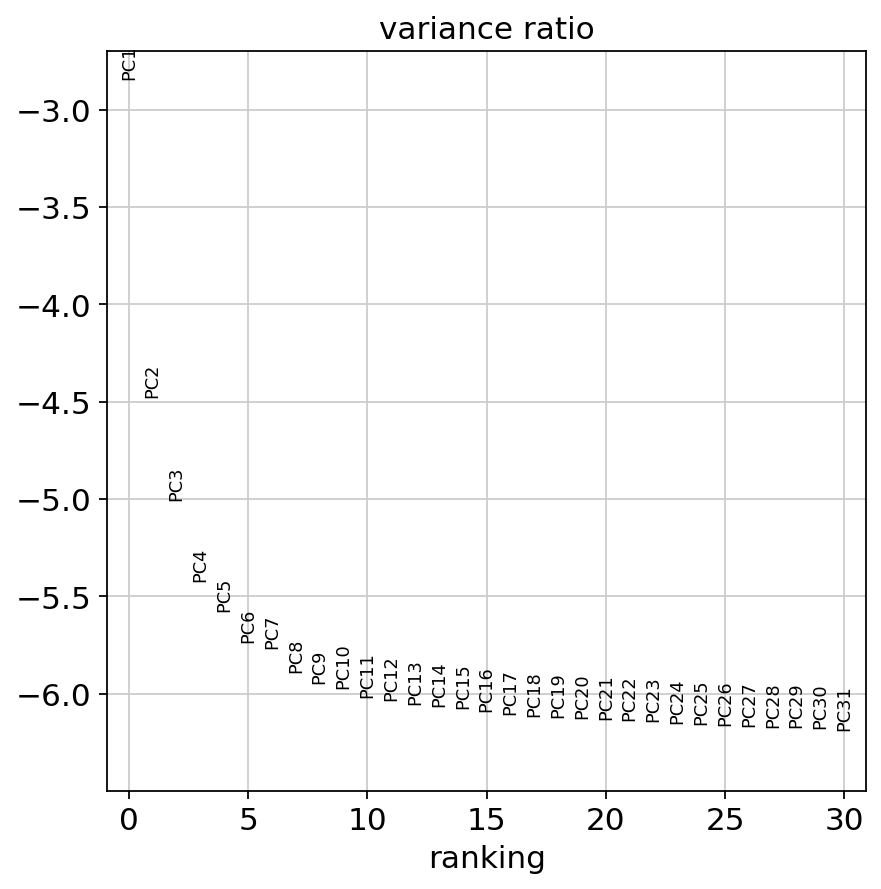

In [14]:
# ============================================
# 12. PCA
# ============================================

sc.tl.pca(
    adata,
    svd_solver="arpack"
)

# PCA variance plot
sc.pl.pca_variance_ratio(
    adata,
    log=True
)

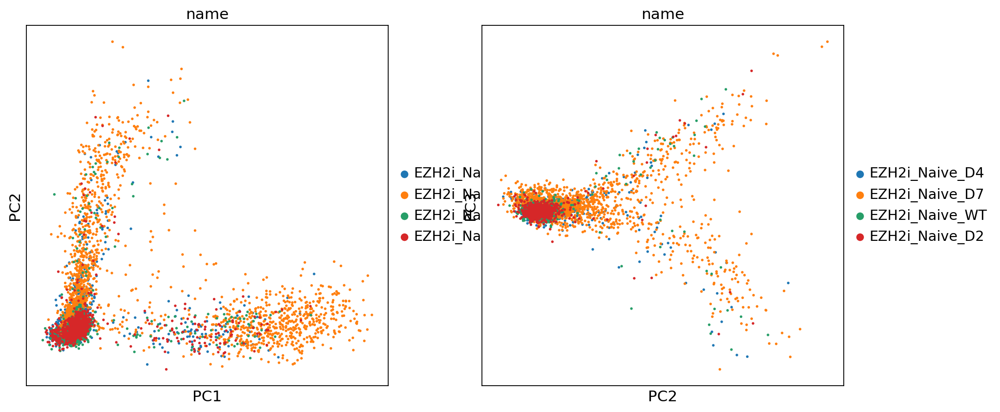

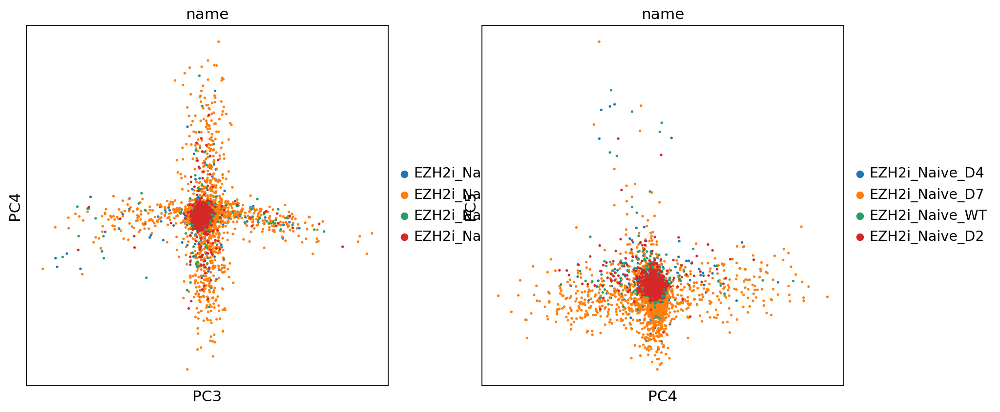

In [15]:
sc.pl.pca(
    adata,
    color="name",
    components=["1,2", "2,3"]
)

sc.pl.pca(
    adata,
    color="name",
    components=["3,4", "4,5"]
)



In [16]:
# ============================================
# 13. Compute neighbors
# ============================================

sc.pp.neighbors(
    adata,
    n_neighbors=15,
    n_pcs=30
)


# ============================================
# 14. UMAP
# ============================================

sc.tl.umap(adata)


computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:11)


In [17]:
# ============================================
# 15. Leiden clustering
# ============================================

sc.tl.leiden(
    adata,
    resolution=0.5
)

running Leiden clustering


/tmp/ipykernel_23765/1504318453.py:5: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(


    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


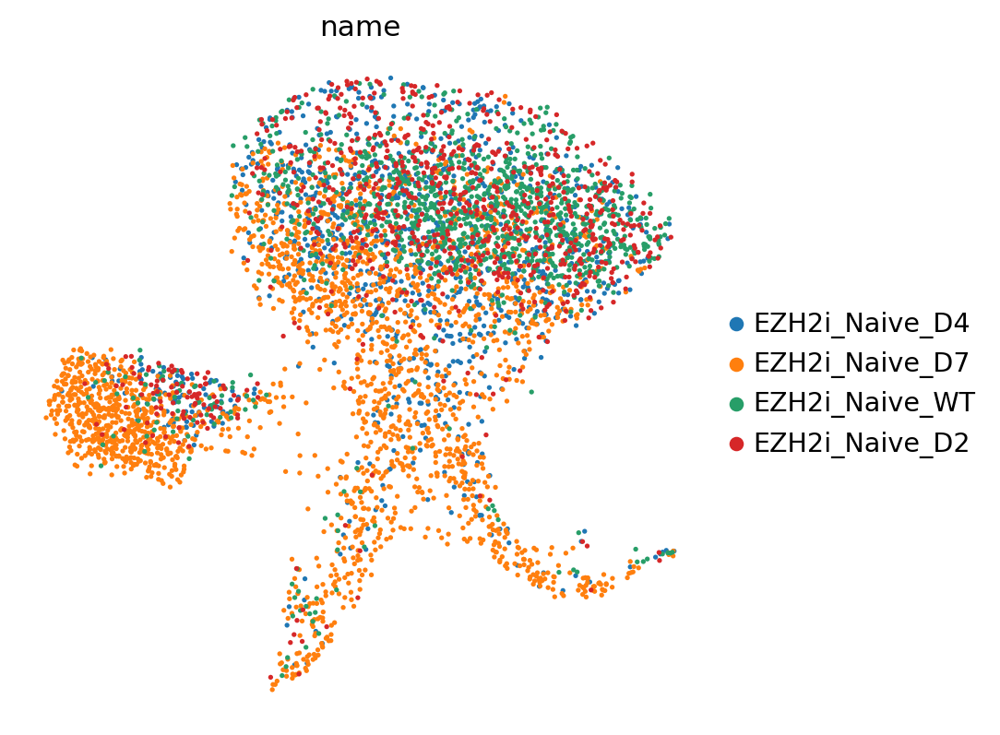

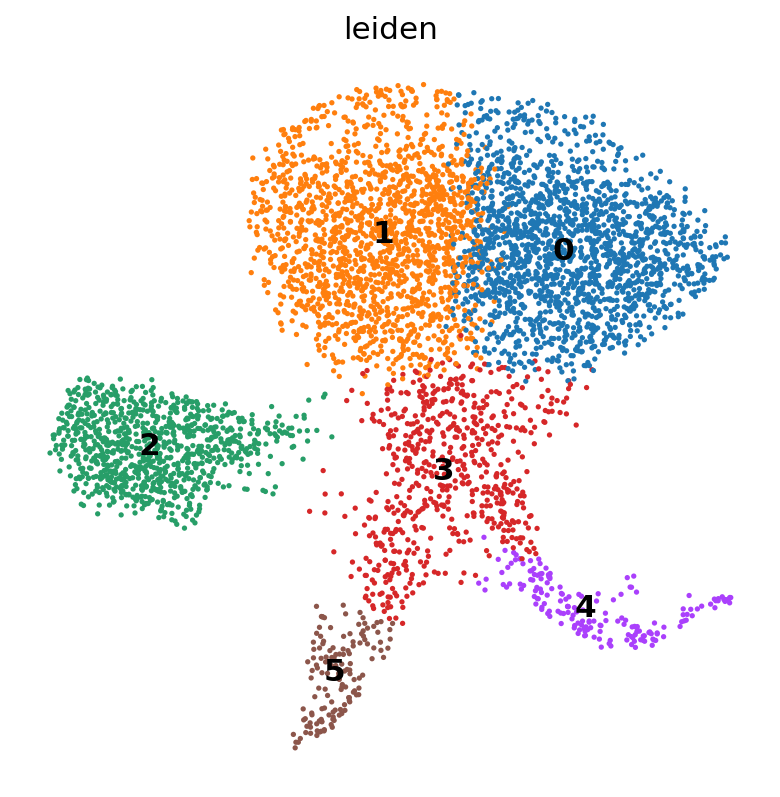

In [18]:
# ============================================
# 16. Plot UMAPs
# ============================================

# Colored by mtxition
sc.pl.umap(
    adata,
    color="name",
    frameon=False
)

# Colored by cluster
sc.pl.umap(
    adata,
    color="leiden",
    legend_loc="on data",
    frameon=False
)

['GATA3', 'CLDN4', 'TMEM88', 'KRT18', 'HAND1', 'TWIST1', 'CD24']


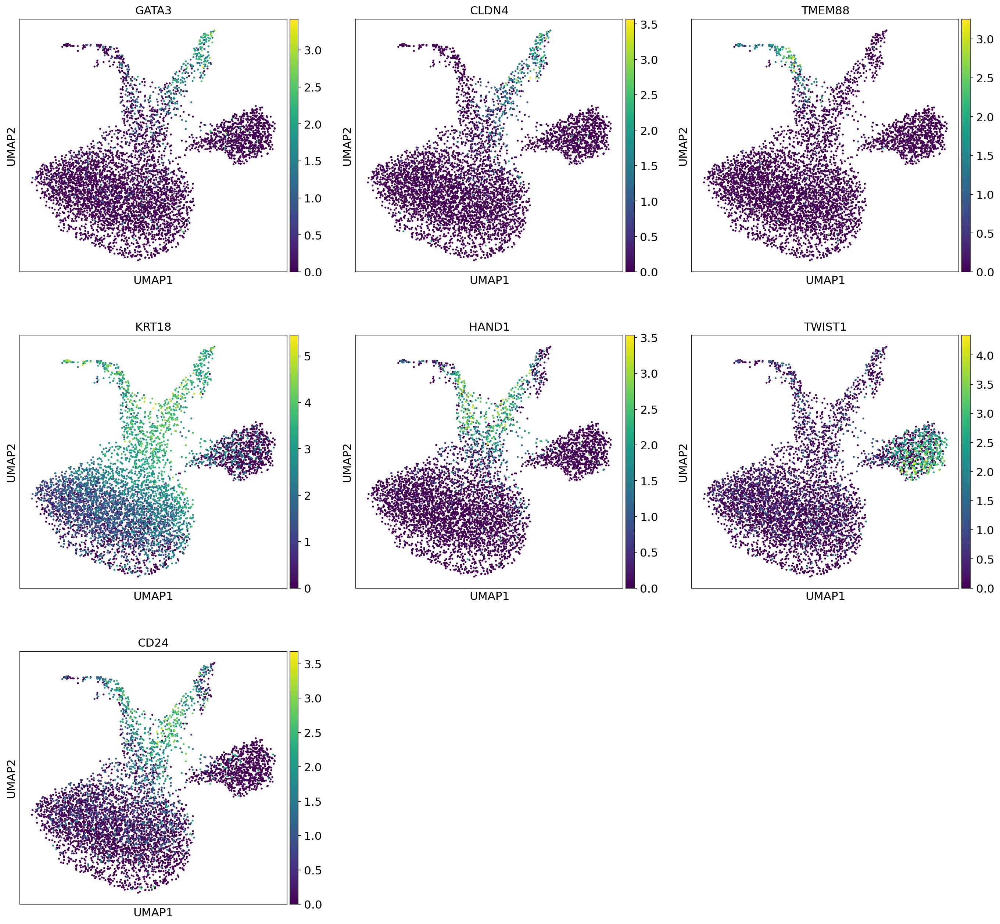

In [92]:
# ============================================
# 17. Marker gene visualization
# ============================================

#print all available adata.var_names

marker_genes = [
    "SOX2",  
    "NANOG",
    "GATA3", 
    "CLDN4",
    "TP63",
    "CGB",
    "TMEM88", 
    "KRT18",  
    "TBXT",
    "SOX9",
    "HAND1",
    "TWIST1",
    "TBX3",
    "CDX1",
    "CDX2",
    "TFAP2A",
    "TFAP2C", 
    "CD24", 
]

existing_markers = [
    g for g in marker_genes
   if g in adata.var_names
]

print(existing_markers)

# plot panel with 2 plots per row
sc.pl.umap(
    adata,
    color=existing_markers,
    ncols=3
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


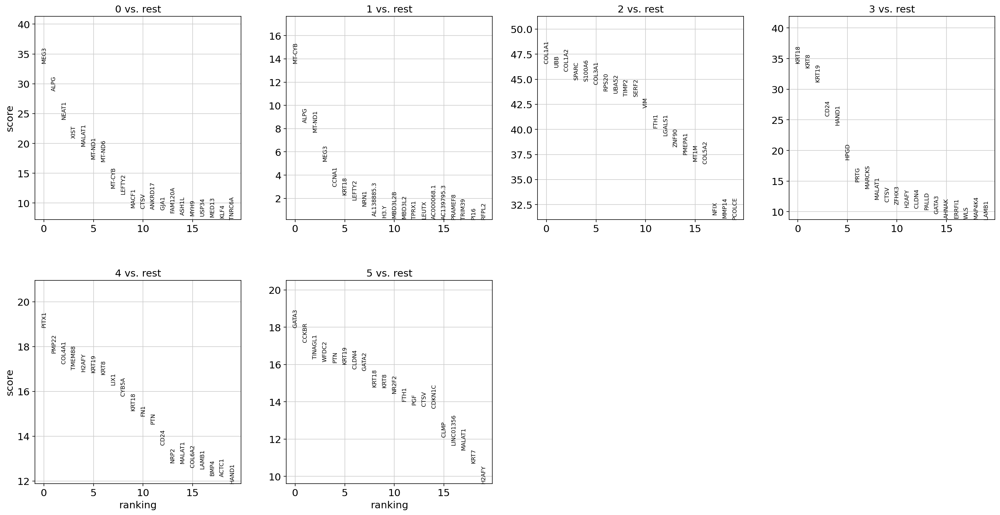

In [20]:


# ============================================
# 18. Find marker genes per cluster
# ============================================

sc.tl.rank_genes_groups(
    adata,
    groupby="leiden",
    method="wilcoxon"
)

# Show top markers
sc.pl.rank_genes_groups(
    adata,
    n_genes=20,
    sharey=False
)



running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


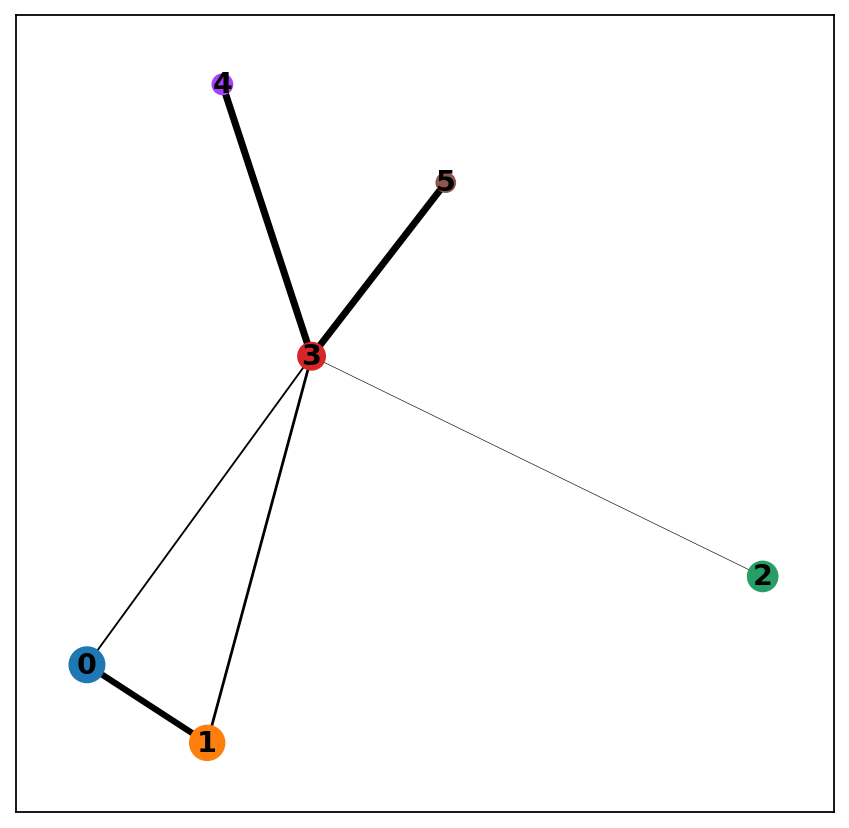

In [21]:
# PAGA trajectory graph
sc.tl.paga(
    adata,
    groups="leiden"
)

# Plot connectivity graph
sc.pl.paga(
    adata,
    threshold=0.03,
    show=True
)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)


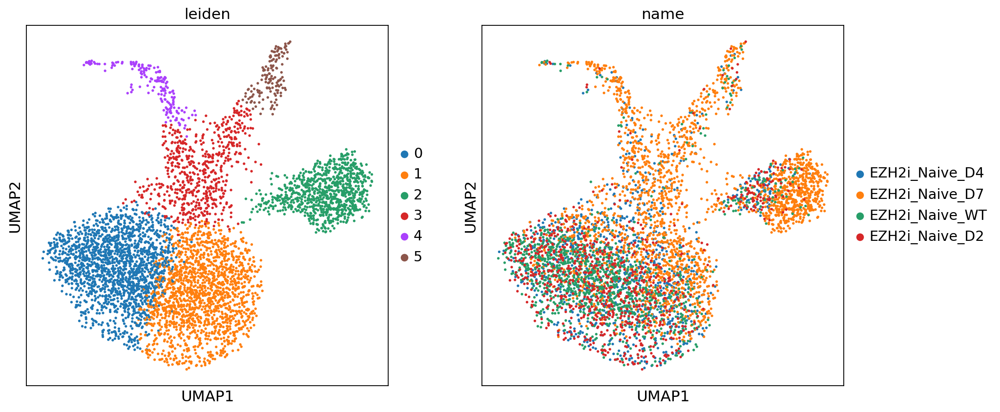

In [22]:
sc.tl.umap(
    adata,
    init_pos='paga'
)

sc.pl.umap(
    adata,
    color=["leiden", "name"]
)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99578565 0.99115676 0.9888418  0.9742629  0.96204144
     0.93660253 0.9263733  0.91843176 0.8958884  0.8861471  0.8717772
     0.845348   0.844889   0.84338343]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


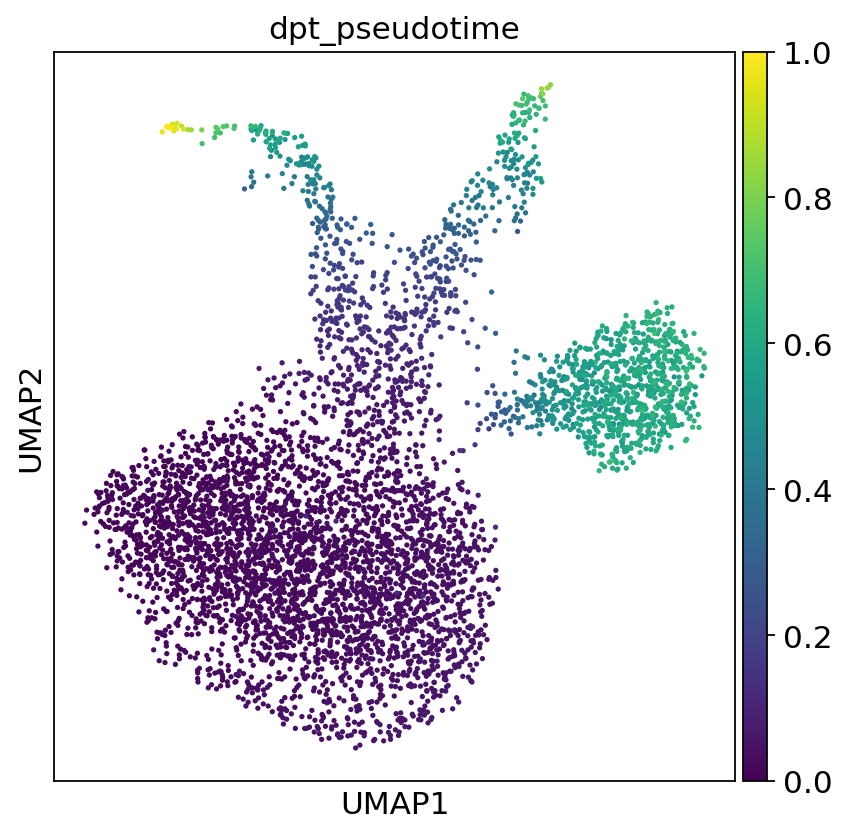

In [23]:
adata.uns['iroot'] = np.flatnonzero(
    adata.obs['leiden'] == '0'
)[0]

sc.tl.dpt(adata)

sc.pl.umap(
    adata,
    color="dpt_pseudotime",
    cmap="viridis"
)

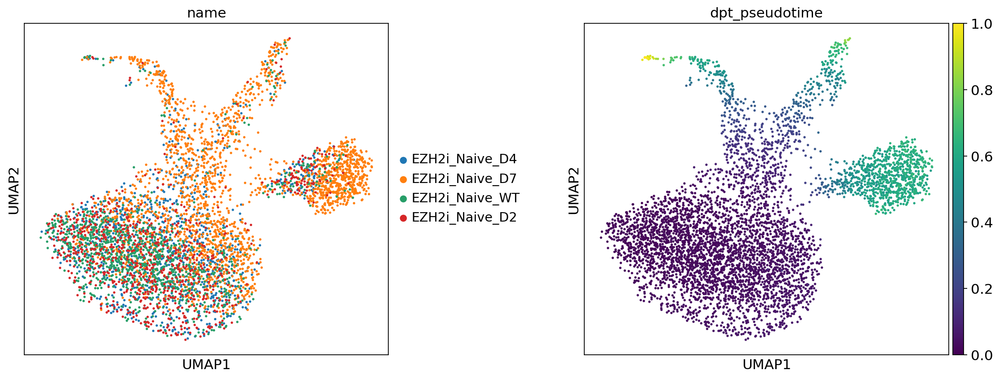

In [24]:
sc.pl.umap(
    adata,
    color=["name", "dpt_pseudotime"],
    wspace=0.4
)

--> added 'pos', the PAGA positions (adata.uns['paga'])


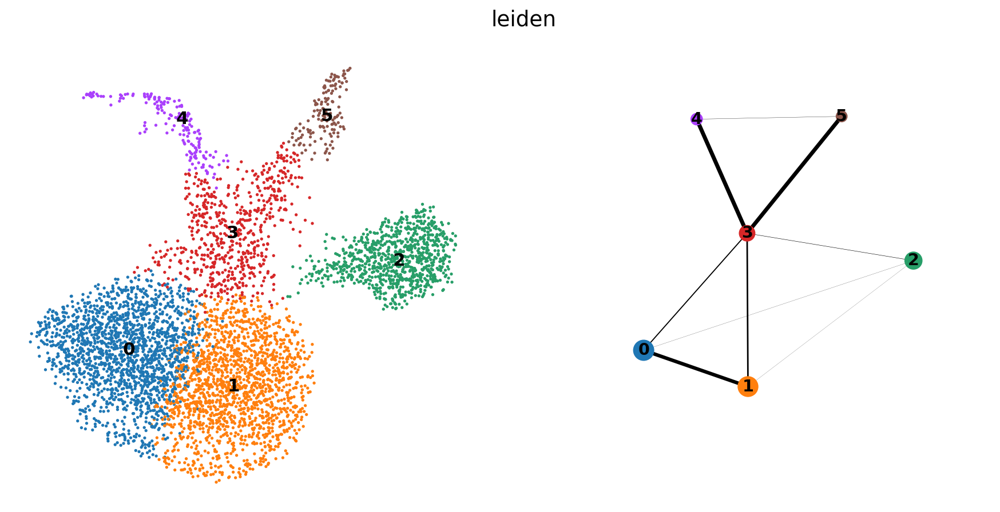

In [25]:
sc.pl.paga_compare(
    adata,
    basis='umap',
    show=True
)

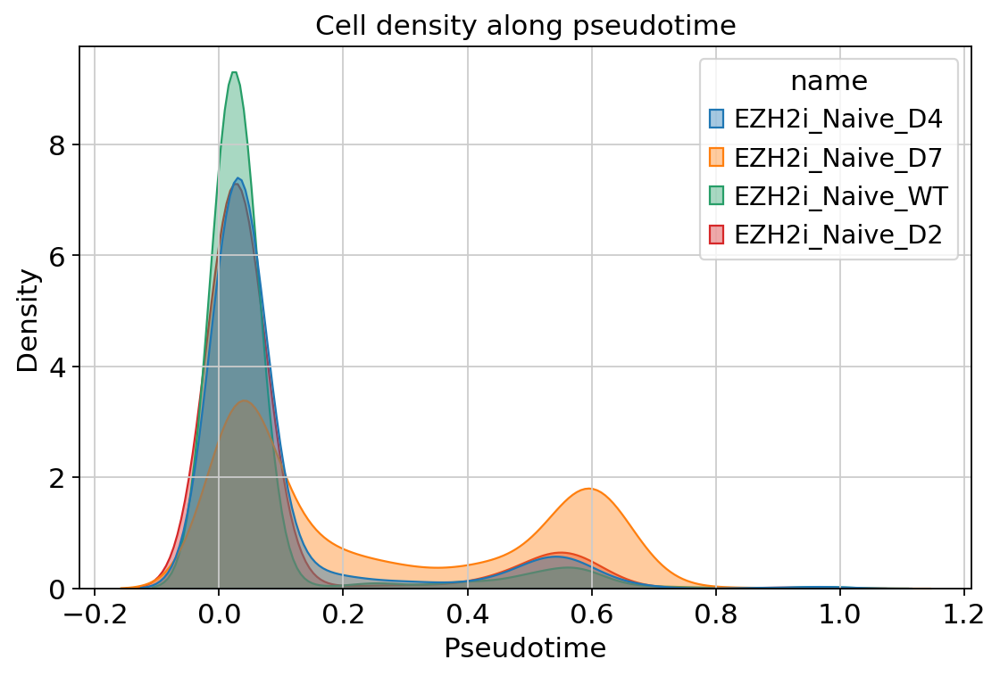

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert obs to dataframe
df = adata.obs.copy()

plt.figure(figsize=(8, 5))

sns.kdeplot(
    data=df,
    x="dpt_pseudotime",
    hue="name",
    fill=True,
    common_norm=False,
    alpha=0.4
)

plt.xlabel("Pseudotime")
plt.ylabel("Density")
plt.title("Cell density along pseudotime")
plt.show()

In [39]:
#%pip install cellrank

import cellrank as cr
from cellrank.kernels import ConnectivityKernel
from cellrank.estimators import GPCCA
import matplotlib.pyplot as plt

# ----------------------------------------------------
# ASSUMPTION:
# You already ran:
# sc.tl.dpt(adata)
# and have:
# adata.obsm["X_pca"], neighbors, UMAP, etc.
# ----------------------------------------------------


# ====================================================
# 1. Ensure neighbors exist (required for CellRank)
# ====================================================

#sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)


# ====================================================
# 2. Build diffusion-based kernel (no RNA velocity needed)
# ====================================================

ck = ConnectivityKernel(adata)
ck.compute_transition_matrix()


# ====================================================
# 3. Learn global fate structure (macrostates)
# ====================================================

g = GPCCA(ck)

# number of macrostates = adjust based on biology
# (try 3–6 usually)
g.compute_schur()

INFO     Computing transition matrix based on adata.obsp['connectivities']                                         
INFO         Finish (0.03s)                                                                                        
WARNING  Unable to import `petsc4py` or `slepc4py`. Using `method='brandts'`                                       
WARNING  For `method='brandts'`, dense matrix is required. Densifying                                              
INFO     Computing Schur decomposition                                                                             
INFO     Adding `adata.uns['eigendecomposition_fwd']`                                                              
                `.schur_vectors`                                                                                   
                `.schur_matrix`                                                                                    
                `.eigendecomposition`                                   

TypeError: TermStatesEstimator.plot_macrostates() missing 1 required positional argument: 'which'

INFO     Computing 4 macrostates                                                                                   
INFO     Adding `.macrostates`                                                                                     
                `.macrostates_memberships`                                                                         
                `.coarse_T`                                                                                        
                `.coarse_initial_distribution                                                                      
                `.coarse_stationary_distribution`                                                                  
                `.schur_vectors`                                                                                   
                `.schur_matrix`                                                                                    
                `.eigendecomposition`                                   

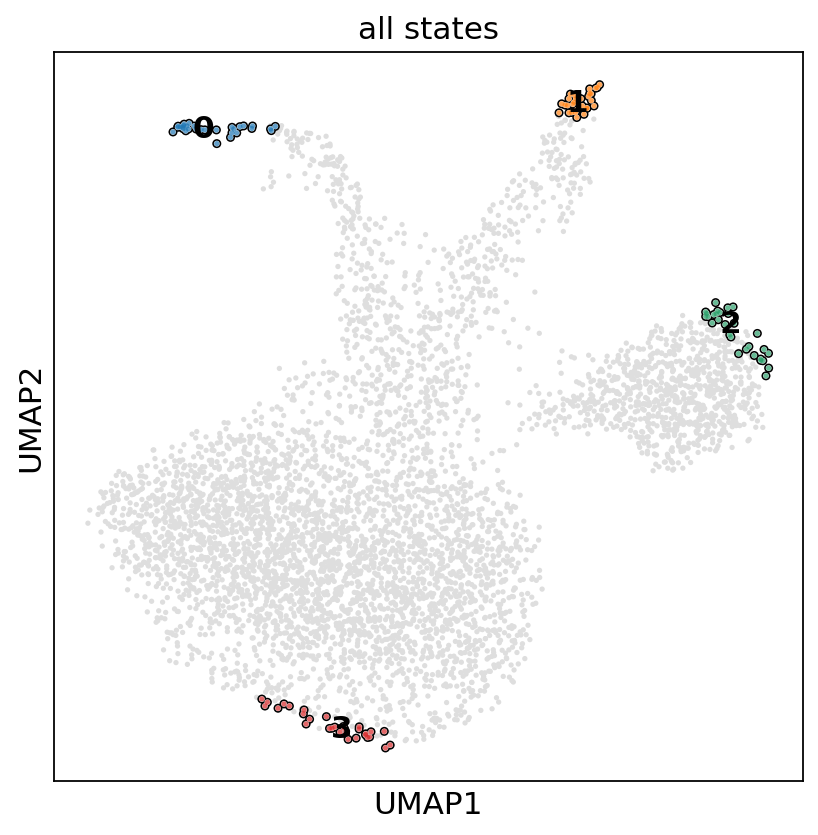

In [57]:
g.compute_macrostates(n_states=4)

g.plot_macrostates(which="all")
plt.show()

INFO     Adding `adata.obs['term_states_fwd']`                                                                     
                `adata.obs['term_states_fwd_probs']`                                                               
                `.terminal_states`                                                                                 
                `.terminal_states_probabilities`                                                                   
                `.terminal_states_memberships                                                                      
             Finish`                                                                                               
INFO     Computing fate probabilities                                                                              


  0%|          | 0/4 [00:00<?, ?/s]

INFO     Adding `adata.obsm['lineages_fwd']`                                                                       
                `.fate_probabilities`                                                                              
             Finish (0.38s)                                                                                        


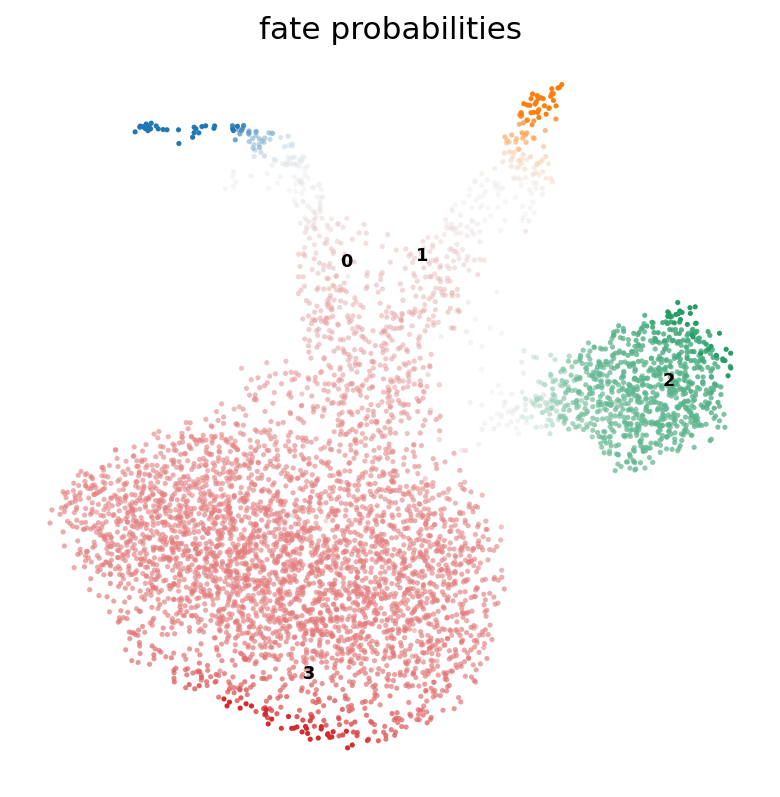

In [58]:
# Alternative Scanpy view:
g.predict_terminal_states()
g.compute_fate_probabilities()

g.plot_fate_probabilities(basis="umap")
plt.show()


INFO     Adding `adata.varm['terminal_lineage_drivers']`                                                           
                `.lineage_drivers`                                                                                 
             Finish (0.15s)                                                                                        


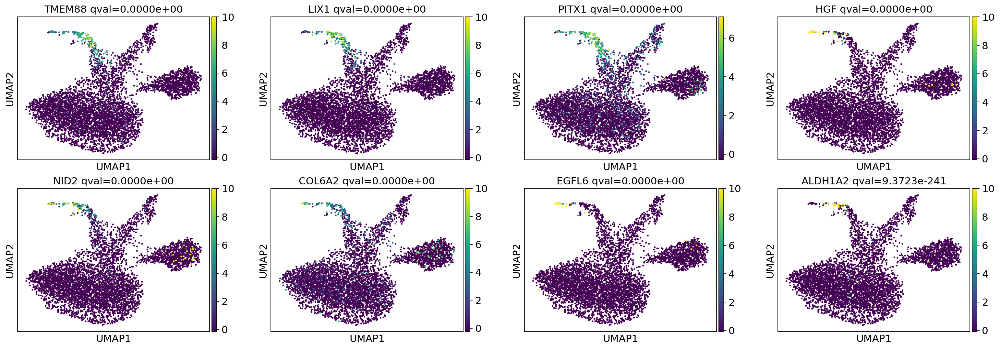

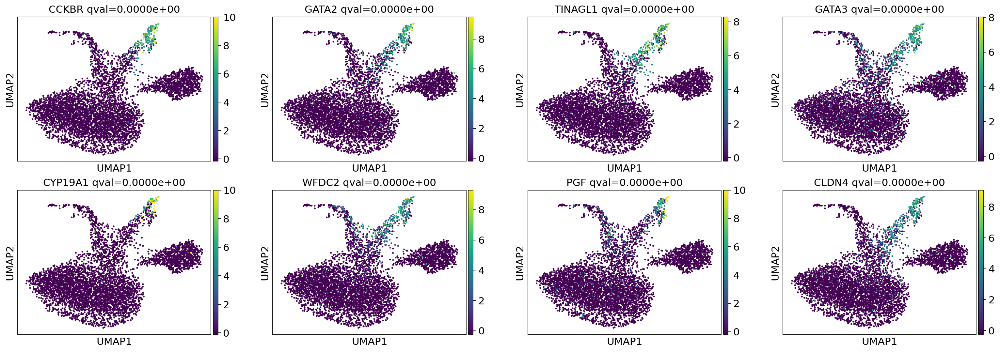

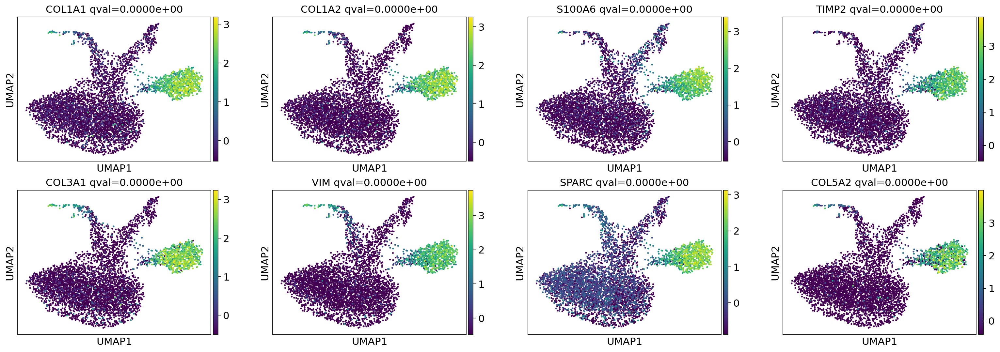

In [72]:
g.compute_lineage_drivers()
g.plot_lineage_drivers(lineage=0)
g.plot_lineage_drivers(lineage=1)
g.plot_lineage_drivers(lineage=2)


INFO     Adding `adata.obs['priming_degree_fwd']`                                                                  
                `.priming_degree`                                                                                  
             Finish                                                                                                


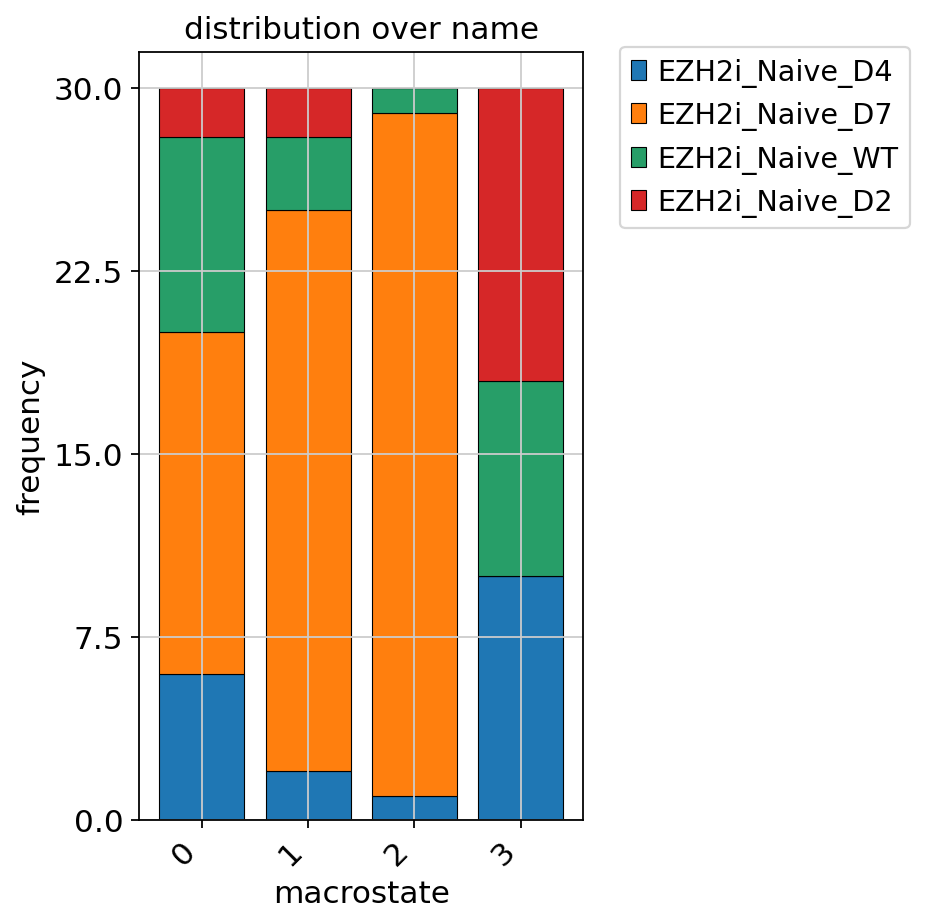

In [87]:
g.compute_lineage_priming()
g.plot_macrostate_composition(key='name')

In [85]:
print(adata.obs.dtypes)

name                     category
n_genes_by_counts           int32
total_counts              float32
total_counts_mt           float32
pct_counts_mt             float32
n_genes                     int64
leiden                   category
dpt_pseudotime            float32
macrostates_fwd          category
term_states_fwd          category
term_states_fwd_probs     float64
priming_degree_fwd        float64
dtype: object


In [27]:

# ============================================
# 19. Save processed object
# ============================================

adata.write("combined_scRNAseq.h5ad")

print("\nSaved combined_scRNAseq.h5ad")


# ============================================
# 20. Reload later
# ============================================

# adata = sc.read_h5ad("combined_scRNAseq.h5ad")


Saved combined_scRNAseq.h5ad


In [28]:


# ============================================
# 20. Reload later
# ============================================

#adata = sc.read_h5ad("combined_scRNAseq.h5ad")